# Causal Modelling with DoWhy and EconML

# Imports

In [4]:
import numpy as np
import pandas as pd

from dowhy import CausalModel, plotter
from IPython.display import Image, display
import matplotlib

from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor

import econml

# Read data

In [5]:
df = pd.read_csv('../data/causal_df.csv')

In [6]:
df.head()

,Unnamed: 0,date,day_of_week,weather_region_cd,maximum_feels_like_temperature,rainfall,sunshine_td,avg_ice_cream_price,ice_cream_sold,cpih,month
0,0,2022-03-27,0.0,1.0,15.4,0.2,12.1,2.704702,1498.0,6.2,3.0
1,1,2022-03-27,0.0,10.0,12.7,0.0,10.6,2.704702,2285.0,6.2,3.0
2,2,2022-03-27,0.0,11.0,15.1,0.0,10.2,2.704702,5509.0,6.2,3.0
3,3,2022-03-27,0.0,12.0,10.7,0.0,5.3,2.704702,7776.0,6.2,3.0
4,4,2022-03-27,0.0,13.0,13.1,0.0,8.6,2.704702,4903.0,6.2,3.0


# Creating Causal Graph

In [7]:
causal_graph = """
digraph {

weather_region_cd;
maximum_feels_like_temperature;
avg_ice_cream_price;
ice_cream_sold;
day_of_week;
month;
U[label="Unobserved Confounders"];

weather_region_cd->maximum_feels_like_temperature;
weather_region_cd->avg_ice_cream_price;

month->maximum_feels_like_temperature;

U->ice_cream_sold;
avg_ice_cream_price->ice_cream_sold; 
maximum_feels_like_temperature->ice_cream_sold;
weather_region_cd->ice_cream_sold;
month->ice_cream_sold;
day_of_week->ice_cream_sold;
}
"""

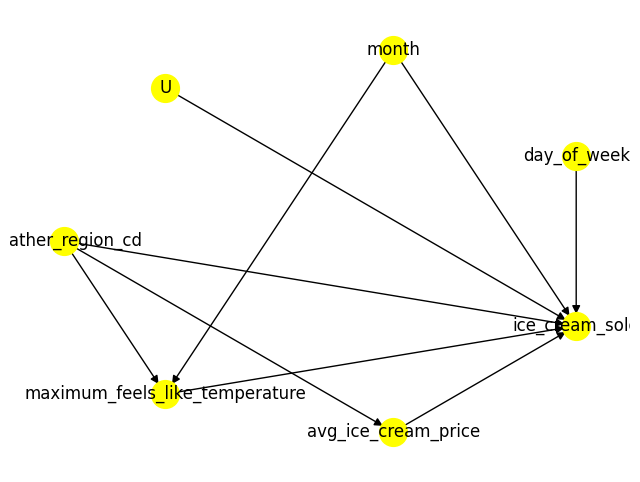

In [8]:
model= CausalModel(
        data = df,
        graph=causal_graph.replace("\n", " "),
        treatment='maximum_feels_like_temperature',
        outcome='ice_cream_sold'
        )

model.view_model()

# Identify Causal Effects

In [9]:
#Identify the causal effect
estimands = model.identify_effect(proceed_when_unidentifiable=True)
print(estimands)

Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                                           
─────────────────────────────────(E[ice_cream_sold|weather_region_cd,month])
d[maximum_feels_like_temperature]                                           
Estimand assumption 1, Unconfoundedness: If U→{maximum_feels_like_temperature} and U→ice_cream_sold then P(ice_cream_sold|maximum_feels_like_temperature,weather_region_cd,month,U) = P(ice_cream_sold|maximum_feels_like_temperature,weather_region_cd,month)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



# Estimate Causal Effects

In [10]:
#Causal Effect Estimation

controls = []
values = []

for control in range(0, 35, 5):

    estimate = model.estimate_effect(estimands,method_name="backdoor.econml.dml.CausalForestDML",
                                        method_params={
                                            'init_params': {'model_y':LassoCV(),
                                                            'model_t': LassoCV()},
                                            'fit_params': {}
                                        }, confidence_intervals=False, test_significance=False,
                                        control_value=control, treatment_value=control+1)

    controls.append(control)
    values.append(estimate.value)

dict_effects = {}
dict_effects['temp'] = controls
dict_effects['effects'] = values

/Users/adi.jacobson/miniconda3/envs/icecream/lib/python3.11/site-packages/shap/utils/_clustering.py:34: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit
/Users/adi.jacobson/miniconda3/envs/icecream/lib/python3.11/site-packages/shap/utils/_clustering.py:53: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit
/Users/adi.jacobson/miniconda3/envs/icecream/lib/pytho

In [11]:
df_effects = pd.DataFrame.from_dict(dict_effects)

<Axes: xlabel='temp'>

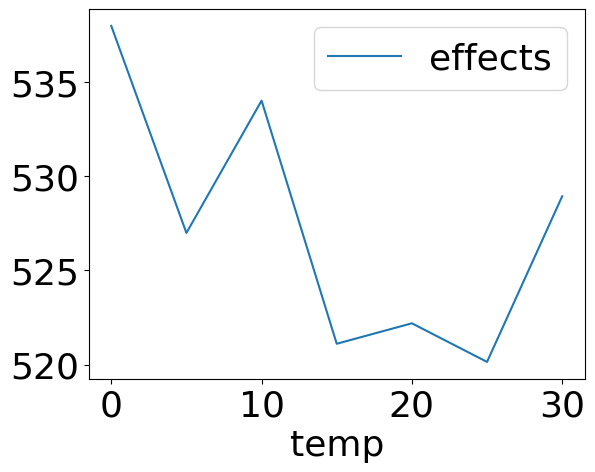

In [12]:
df_effects.plot(x='temp', y='effects')

# Refutes

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please cha

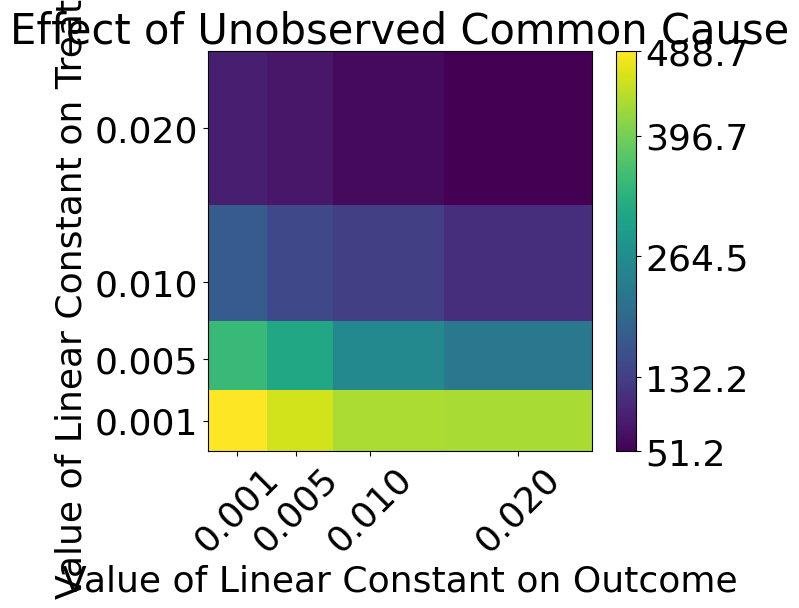

In [13]:
refutel_random_common_cause = model.refute_estimate(estimands,estimate, "random_common_cause")

refutel_placebo_treatment_refuter = model.refute_estimate(estimands,estimate, "placebo_treatment_refuter")

refutel_data_subset_refuter = model.refute_estimate(estimands,estimate, "data_subset_refuter")

res_unobserved_range = model.refute_estimate(estimands, estimate, method_name="add_unobserved_common_cause",
                                           confounders_effect_on_treatment="binary_flip", confounders_effect_on_outcome="linear",
                                           effect_strength_on_treatment=[0.001, 0.005, 0.01, 0.02],
                                           effect_strength_on_outcome=[0.001, 0.005, 0.01,0.02])


In [14]:
print(refutel_random_common_cause)

Refute: Add a random common cause
Estimated effect:528.9312108028014
New effect:526.5991101317206
p value:0.4



In [15]:
print(refutel_placebo_treatment_refuter)

Refute: Use a Placebo Treatment
Estimated effect:528.9312108028014
New effect:0.0
p value:1.0



In [16]:
print(refutel_data_subset_refuter)

Refute: Use a subset of data
Estimated effect:528.9312108028014
New effect:518.0634369834922
p value:0.25



In [17]:
print(res_unobserved_range)

Refute: Add an Unobserved Common Cause
Estimated effect:528.9312108028014
New effect:(51.15071819432224, 488.6751314859039)



# Final Estimates